<font size=5> Importazione dataset </font>

In [1]:
from sklearn import datasets
from sklearn.datasets import load_breast_cancer
data, target = load_breast_cancer(return_X_y=True, as_frame=True)
data0 = data
data0.insert(0, 'Type', target)
labels = data0.columns

<font size=5> Importazioni </font>

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
from pandas.plotting import parallel_coordinates
import seaborn as sns
from sklearn import preprocessing
import numpy as np
import math

<font size=5> Lista colori </font>

In [3]:
def pltcolor(classe):
    cols=[]
    for c in classe:
        if c==0:
            cols.append('red')
        else:
            cols.append('#6495ed')
    return cols

cols=pltcolor(list(target))

<font size=5> Creo dataset separati </font>

In [4]:
id = list(data0.index)
data_mean = data0.iloc[id, [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]]
data_worst = data0.iloc[id, [0, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30]]

<font size=5> Parallel plot sul dataset </font>

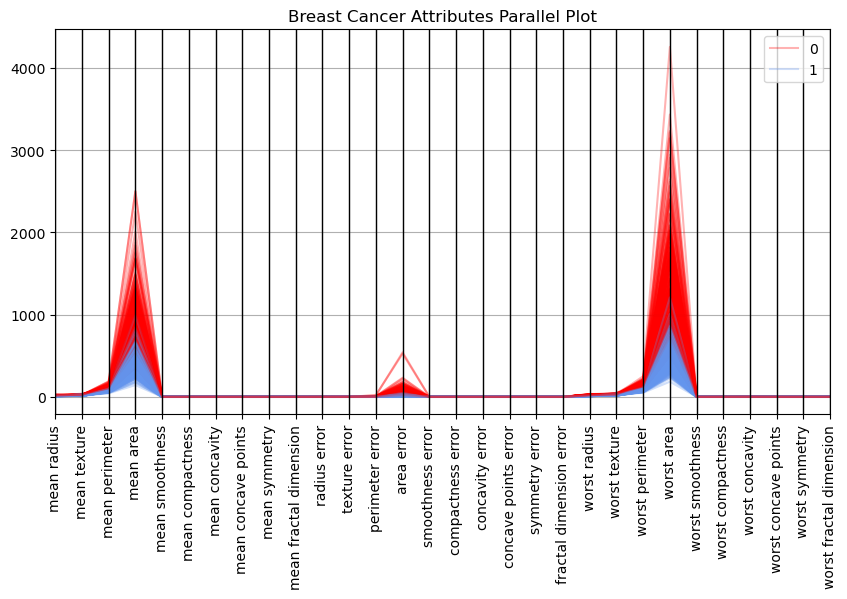

In [5]:
plt.style.use('default')
plt.rc('figure', figsize=(10.0, 5.0))
parallel_coordinates(data0, 'Type',
                     color=['red', '#6495ed'],
                     alpha=0.3,)

plt.xticks(rotation=90)
plt.title("Breast Cancer Attributes Parallel Plot")
plt.show()

<font size=5> Parallel plot su dataset mean con focus </font>

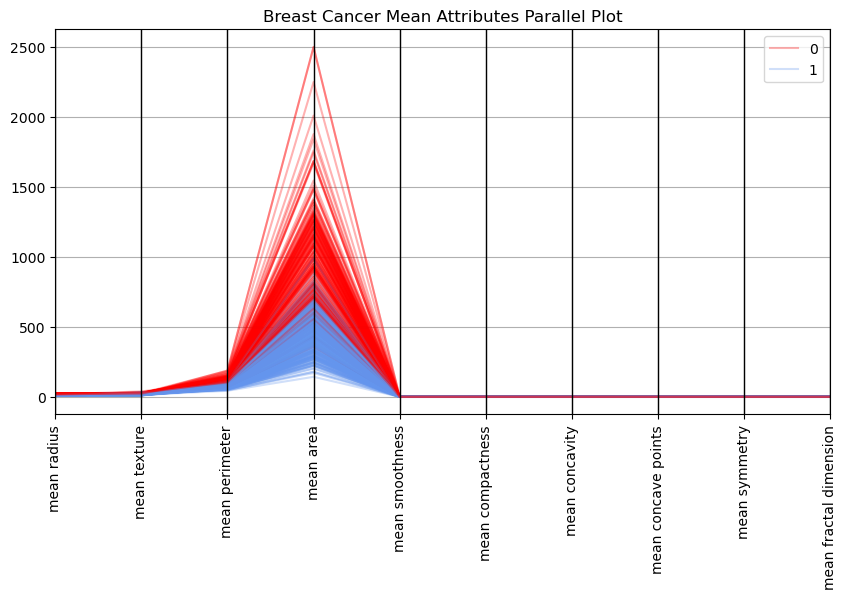

In [6]:
plt.style.use('default')
plt.rc('figure', figsize=(10.0, 5.0))
parallel_coordinates(data_mean, 'Type',
                     color=['red', '#6495ed'],
                     alpha=0.3,)

plt.xticks(rotation=90)
plt.title("Breast Cancer Mean Attributes Parallel Plot")
plt.show()

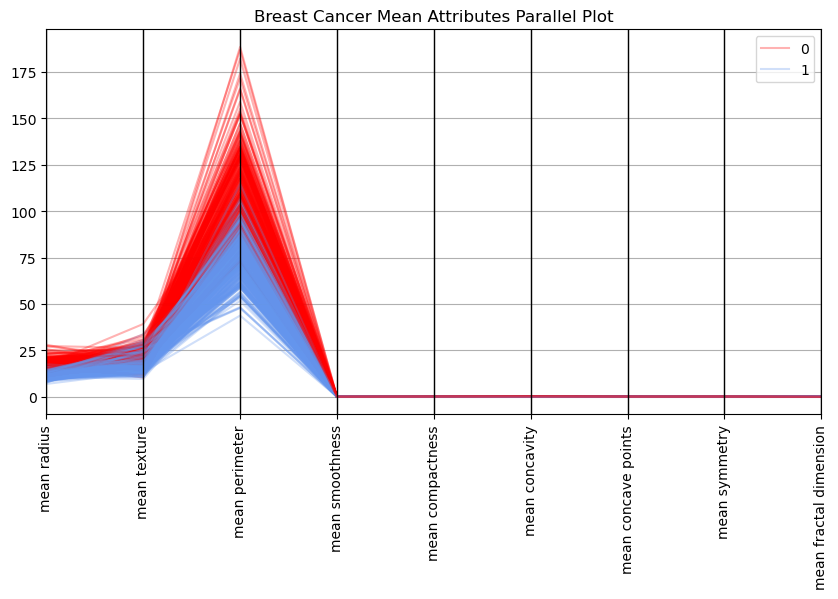

In [7]:
data_focus1 = data_mean.drop(['mean area'], axis = 1)
parallel_coordinates(data_focus1, 'Type',
                     color=['red', '#6495ed'],
                     alpha=0.3,)

plt.xticks(rotation=90)
plt.title("Breast Cancer Mean Attributes Parallel Plot")
plt.show()

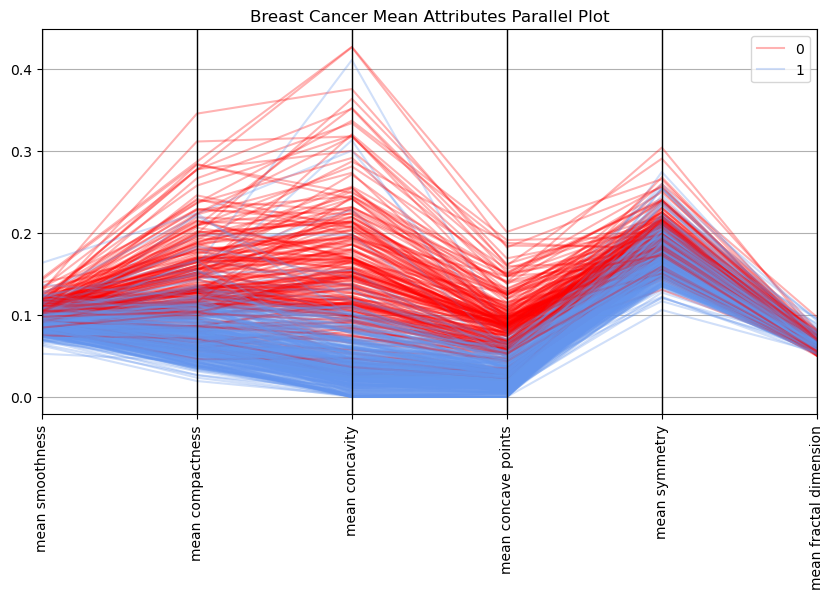

In [8]:
data_focus2 = data_focus1.drop(['mean radius', 'mean texture', 'mean perimeter'], axis = 1)
parallel_coordinates(data_focus2, 'Type',
                     color=['red', '#6495ed'],
                     alpha=0.3,)

plt.xticks(rotation=90)
plt.title("Breast Cancer Mean Attributes Parallel Plot")
plt.show()

<font size=8> Normalizzazione dei dati </font>

In [9]:
scaler = preprocessing.MinMaxScaler()

colms = data_mean.columns
np_scaled = scaler.fit_transform(data_mean)
mean_norm = pd.DataFrame(np_scaled, columns = colms)

colms = data_worst.columns
np_scaled = scaler.fit_transform(data_worst)
worst_norm = pd.DataFrame(np_scaled, columns = colms)

colms = data0.columns 
np_scaled = scaler.fit_transform(data0) 
data_norm = pd.DataFrame(np_scaled, columns = colms) 

<font size=5> Parallel plot su dataset normalizzato </font>

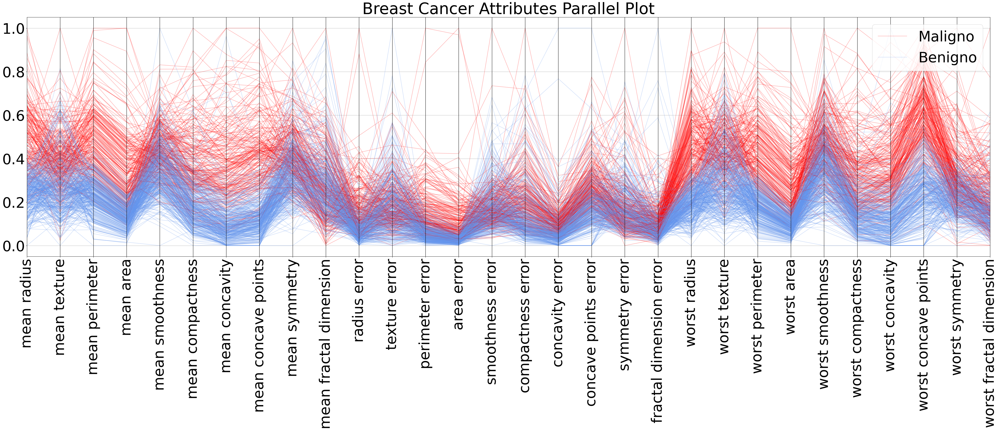

In [10]:
plt.style.use('default')
plt.rc('figure', figsize=(60.0, 15.0))
parallel_coordinates(data_norm, 'Type',
                     color=['red', '#6495ed'],
                     alpha=0.3,)

plt.xticks(rotation=90)
plt.xticks(fontsize=50)
plt.yticks(fontsize=50)
L=plt.legend(fontsize=50, loc='upper right')
L.get_texts()[0].set_text('Maligno')
L.get_texts()[1].set_text('Benigno')
plt.title("Breast Cancer Attributes Parallel Plot", size=55)
plt.show()

<font size=5> Parallel plot su dataset mean normalizzato </font>

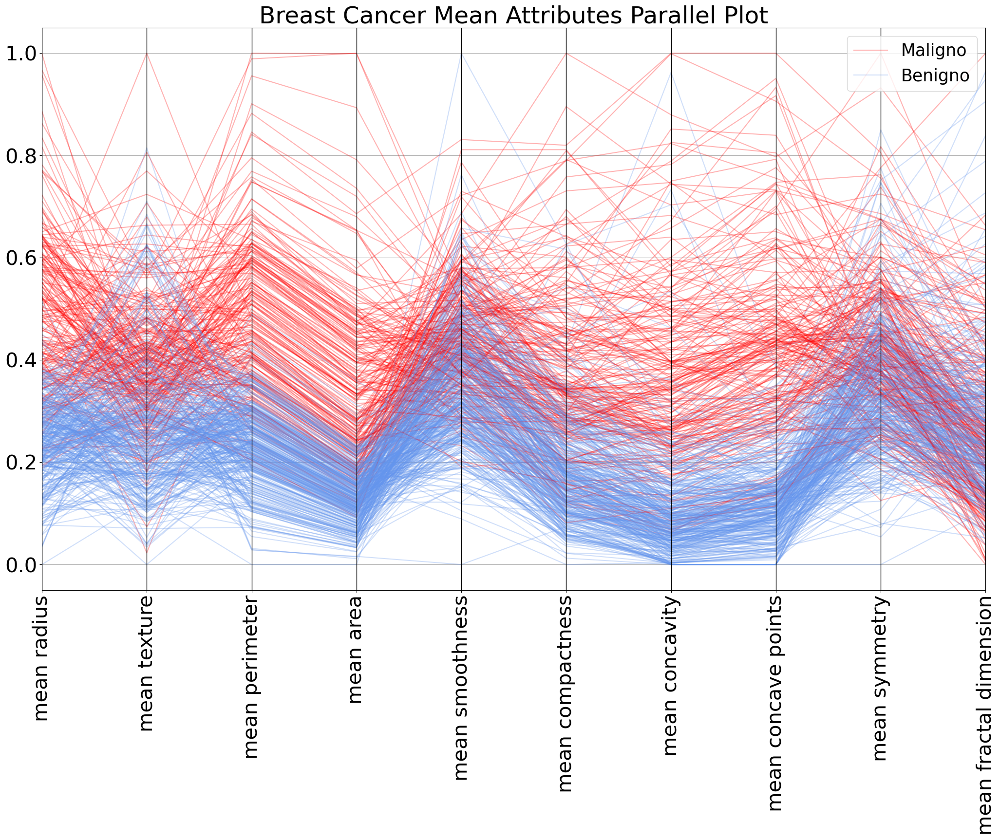

In [11]:
plt.style.use('default')
plt.rc('figure', figsize=(25.0, 15.0))
parallel_coordinates(mean_norm, 'Type',
                     color=['red', '#6495ed'],
                     alpha=0.3,)

plt.xticks(rotation=90)
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)
L=plt.legend(fontsize=25, loc='upper right')
L.get_texts()[0].set_text('Maligno')
L.get_texts()[1].set_text('Benigno')
plt.title("Breast Cancer Mean Attributes Parallel Plot", size=35)
plt.show()

<font size=5> Matrici di correlazione </font>

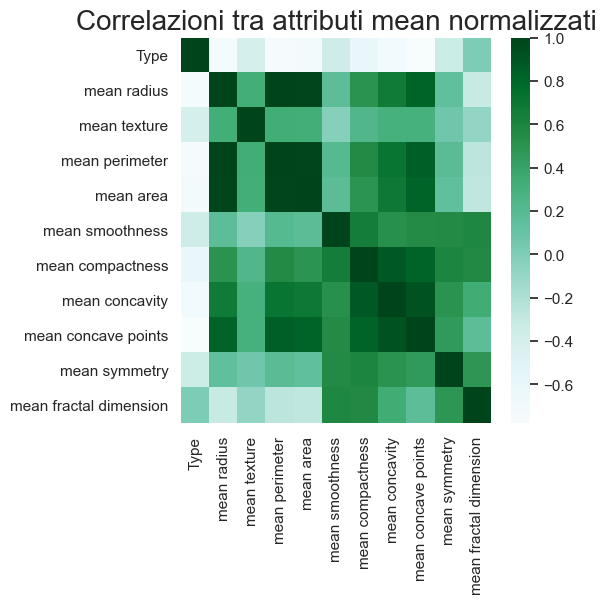

In [12]:
sns.set(rc={'figure.figsize':(5,5)})

sns.heatmap(mean_norm.corr(), cmap='BuGn').set_title("Correlazioni tra attributi mean normalizzati", size= 20)
plt.show()

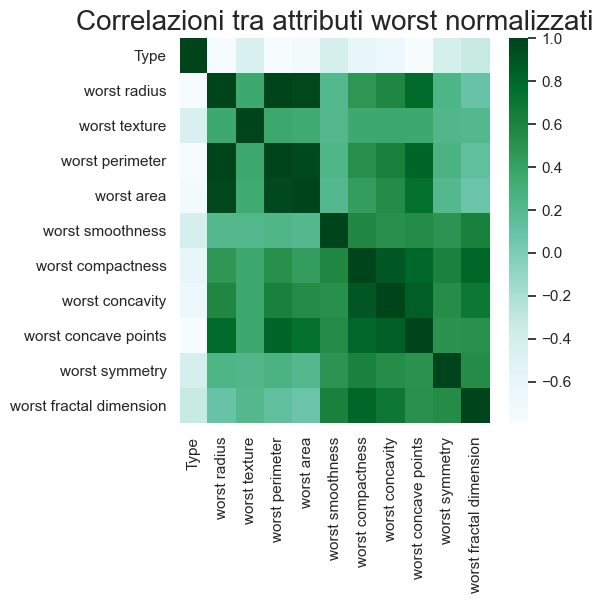

In [13]:
#matrice di correlazione sul dataset con solo i worst per vedere se ci sono delle differenze con quella mean
sns.set(rc={'figure.figsize':(5,5)})

sns.heatmap(worst_norm.corr(), cmap='BuGn').set_title("Correlazioni tra attributi worst normalizzati", size= 20)
plt.show()

<font size=5> Small multiple costituito da scatter plot tra attributi mean correlati </font>

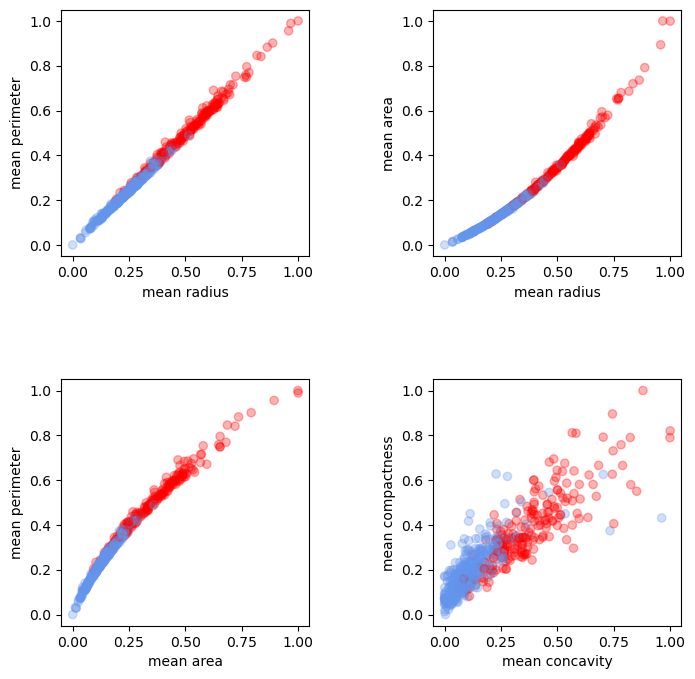

In [14]:
plt.style.use('default')
fig , axs = plt.subplots( nrows=2, ncols=2, figsize= (8,8))

axs[0,0].scatter("mean radius", "mean perimeter", data=mean_norm, c=cols, alpha=0.3)
axs[0,0].set_xlabel('mean radius')
axs[0,0].set_ylabel('mean perimeter')

axs[0,1].scatter("mean radius", "mean area", data=mean_norm, c=cols, alpha=0.3)
axs[0,1].set_xlabel('mean radius')
axs[0,1].set_ylabel('mean area')

axs[1,0].scatter("mean area", "mean perimeter", data=mean_norm, c=cols, alpha=0.3)
axs[1,0].set_xlabel('mean area')
axs[1,0].set_ylabel('mean perimeter')

axs[1,1].scatter("mean concavity", "mean compactness", data=mean_norm, c=cols, alpha=0.3)
axs[1,1].set_xlabel('mean concavity')
axs[1,1].set_ylabel('mean compactness')

fig.subplots_adjust(wspace=0.5, hspace=0.5)

<font size=5> Comparazione tra coppie di attributi che risultano avere un grado di correlazione diversa
nelle due matrici di correlazione (mean, worst) </font>

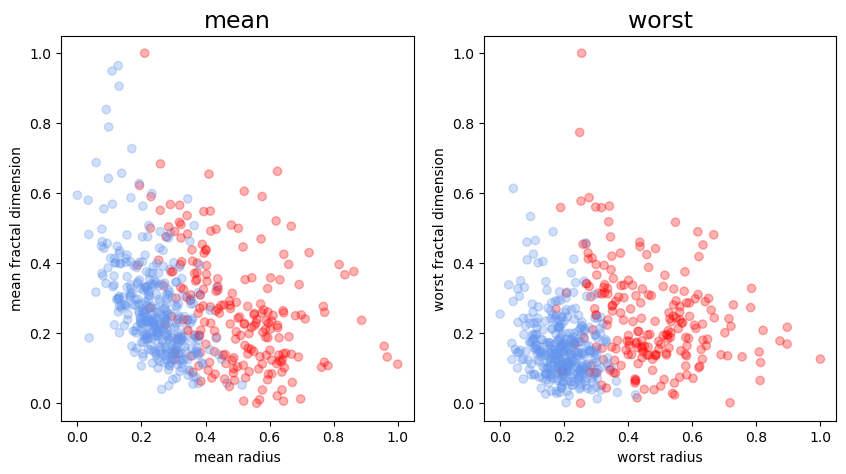

In [15]:
plt.style.use('default')
fig , axs = plt.subplots( nrows=1, ncols=2, figsize= (10,5))

axs[0].scatter("mean radius", "mean fractal dimension", data=mean_norm, c=cols, alpha=0.3)
axs[0].set_xlabel('mean radius')
axs[0].set_ylabel('mean fractal dimension')
axs[0].set_title('mean', size=17)

axs[1].scatter("worst radius", "worst fractal dimension", data=worst_norm, c=cols, alpha=0.3)
axs[1].set_xlabel('worst radius')
axs[1].set_ylabel('worst fractal dimension')
axs[1].set_title('worst', size=17)

plt.show()

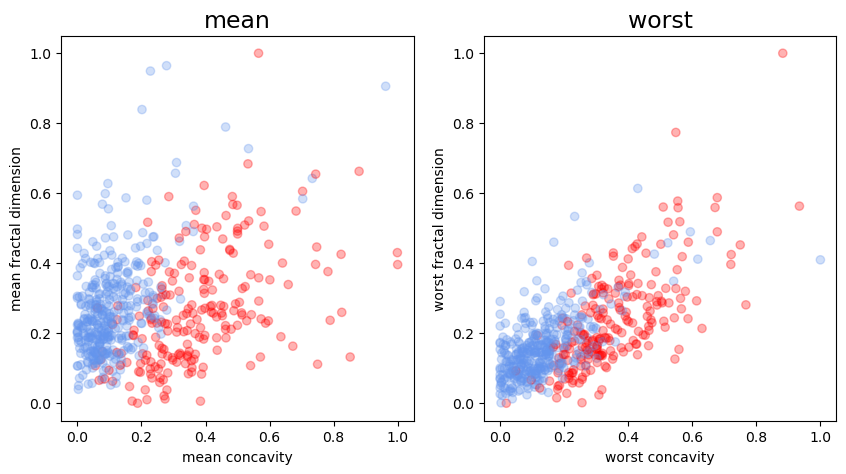

In [16]:
plt.style.use('default')
fig , axs = plt.subplots( nrows=1, ncols=2, figsize= (10,5))

axs[0].scatter("mean concavity", "mean fractal dimension", data=mean_norm, c=cols, alpha=0.3)
axs[0].set_xlabel('mean concavity')
axs[0].set_ylabel('mean fractal dimension')
axs[0].set_title('mean', size=17)

axs[1].scatter("worst concavity", "worst fractal dimension", data=worst_norm, c=cols, alpha=0.3)
axs[1].set_xlabel('worst concavity')
axs[1].set_ylabel('worst fractal dimension')
axs[1].set_title('worst', size=17)


plt.show()

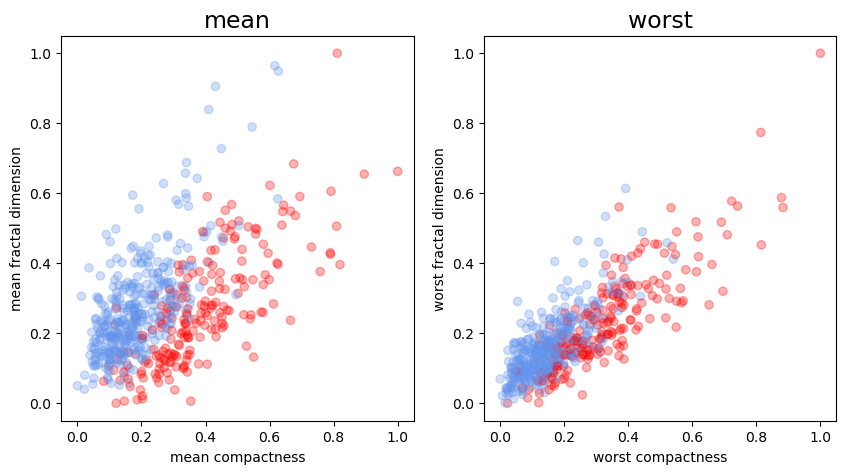

In [17]:
plt.style.use('default')
fig , axs = plt.subplots( nrows=1, ncols=2, figsize= (10,5))

axs[0].scatter("mean compactness", "mean fractal dimension", data=mean_norm, c=cols, alpha=0.3)
axs[0].set_xlabel('mean compactness')
axs[0].set_ylabel('mean fractal dimension')
axs[0].set_title('mean', size=17)

axs[1].scatter("worst compactness", "worst fractal dimension", data=worst_norm, c=cols, alpha=0.3)
axs[1].set_xlabel('worst compactness')
axs[1].set_ylabel('worst fractal dimension')
axs[1].set_title('worst', size=17)


plt.show()

<font size=8> Pazienti Medi </font>

<font size=6> Creazione dataset divisi tra benigni e maligni </font>

In [18]:
pazienti_benigni = data0.loc[data0['Type'] == 1]
pazienti_maligni = data0.loc[data0['Type'] == 0]

<font size=6> Creazione paziente benigno medio </font>

In [19]:
paziente_benigno_medio_dataframe=pd.DataFrame(columns = labels)
paziente_benigno_medio_lista =[]
for i in labels:
    att=list(pazienti_benigni[i])
    paziente_benigno_medio_lista.append((sum(att)/len(att)))

paziente_benigno_medio_serie= pd.Series(data=paziente_benigno_medio_lista, index=labels)

paziente_benigno_medio_dataframe = paziente_benigno_medio_dataframe.append(paziente_benigno_medio_serie, ignore_index=True)

In [20]:
paziente_benigno_medio_dataframe

,Type,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
0,1.0,12.146524,17.914762,78.075406,462.790196,0.092478,0.080085,0.046058,0.025717,0.174186,...,13.379801,23.51507,87.005938,558.89944,0.124959,0.182673,0.166238,0.074444,0.270246,0.079442


<font size=6> Creazione paziente maligno medio </font>

In [21]:
paziente_maligno_medio_dataframe=pd.DataFrame(columns = labels)
paziente_maligno_medio_lista =[]
for i in labels:
    att=list(pazienti_maligni[i])
    paziente_maligno_medio_lista.append((sum(att)/len(att)))

paziente_maligno_medio_serie= pd.Series(data=paziente_maligno_medio_lista, index=labels)

paziente_maligno_medio_dataframe = paziente_maligno_medio_dataframe.append(paziente_maligno_medio_serie, ignore_index=True)

In [22]:
paziente_maligno_medio_dataframe

,Type,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
0,0.0,17.46283,21.604906,115.365377,978.376415,0.102898,0.145188,0.160775,0.08799,0.192909,...,21.134811,29.318208,141.37033,1422.286321,0.144845,0.374824,0.450606,0.182237,0.323468,0.09153


<font size=6> Creazione dataset normalizzati divisi tra benigni e maligni </font>

In [23]:
pazienti_benigni_norm = pd.DataFrame(columns = labels)
for i in data_norm.index:
    if target[i]==1:
        pazienti_benigni_norm=pazienti_benigni_norm.append(data_norm.loc[i], ignore_index=True)

        
pazienti_maligni_norm = pd.DataFrame(columns = labels)
for i in data_norm.index:
    if target[i]==0:
        pazienti_maligni_norm=pazienti_maligni_norm.append(data_norm.loc[i], ignore_index=True)


<font size=6> Propagazione dell'errore quadratico medio </font>

In [24]:
#isolo i dati degli errori

error_benigni = pazienti_benigni_norm.iloc[list(pazienti_benigni_norm.index), [11, 12, 13, 14, 15, 16, 17, 18, 19, 20]]
error_maligni = pazienti_maligni_norm.iloc[list(pazienti_maligni_norm.index), [11, 12, 13, 14, 15, 16, 17, 18, 19, 20]]

In [25]:
mse_error_benigni_list = []
somma = 0

for i in error_benigni.columns:
    errori = list(error_benigni[i])
    for x in errori:
        quadrato = x*x
        somma += quadrato
    mse_error_benigni_list.append(math.sqrt(somma)/len(errori))

In [26]:
mse_error_maligni_list = []
somma = 0

for i in error_maligni.columns:
    errori = list(error_maligni[i])
    for x in errori:
        quadrato = x*x
        somma += quadrato
    mse_error_maligni_list.append(math.sqrt(somma)/len(errori))

<font size=6> Creazione paziente benigno medio normalizzato </font>

In [27]:
paziente_benigno_medio_lista_norm =[]
for i in labels:
    att=list(pazienti_benigni_norm[i])
    paziente_benigno_medio_lista_norm.append((sum(att)/len(att)))

paziente_benigno_medio_serie_norm= pd.Series(data=paziente_benigno_medio_lista_norm, index=labels)
#paziente_benigno_medio_serie_norm

In [28]:
paziente_benigno_medio_serie_norm[11] = mse_error_benigni_list[0]

paziente_benigno_medio_serie_norm[12] = mse_error_benigni_list[1]

paziente_benigno_medio_serie_norm[13] = mse_error_benigni_list[2]

paziente_benigno_medio_serie_norm[14] = mse_error_benigni_list[3]

paziente_benigno_medio_serie_norm[15] = mse_error_benigni_list[4]

paziente_benigno_medio_serie_norm[16] = mse_error_benigni_list[5]

paziente_benigno_medio_serie_norm[17] = mse_error_benigni_list[6]

paziente_benigno_medio_serie_norm[18] = mse_error_benigni_list[7]

paziente_benigno_medio_serie_norm[19] = mse_error_benigni_list[8]

paziente_benigno_medio_serie_norm[20] = mse_error_benigni_list[9]


paziente_benigno_medio_dataframe_norm=pd.DataFrame(columns = labels)
paziente_benigno_medio_dataframe_norm = paziente_benigno_medio_dataframe_norm.append(paziente_benigno_medio_serie_norm, ignore_index=True)
paziente_benigno_medio_lista_norm = list(paziente_benigno_medio_serie_norm)

In [29]:
with pd.option_context('display.max_rows', None, 'display.max_columns', None):  # more options can be specified also
   print(paziente_benigno_medio_dataframe_norm)

   Type  mean radius  mean texture  mean perimeter  mean area  \
0   1.0     0.244476      0.277469        0.236925   0.135436   

   mean smoothness  mean compactness  mean concavity  mean concave points  \
0         0.359733          0.186199        0.107914              0.12782   

   mean symmetry  mean fractal dimension  radius error  texture error  \
0       0.344374                0.271849      0.003947       0.012813   

   perimeter error  area error  smoothness error  compactness error  \
0         0.013322    0.013425          0.017544           0.020201   

   concavity error  concave points error  symmetry error  \
0         0.020963               0.02387        0.026198   

   fractal dimension error  worst radius  worst texture  worst perimeter  \
0                 0.027208      0.193874       0.306372          0.18226   

   worst area  worst smoothness  worst compactness  worst concavity  \
0    0.091845           0.35521           0.150753         0.132778   

   wors

<font size=6> Creazione paziente maligno medio normalizzato </font>

In [30]:
paziente_maligno_medio_lista_norm =[]
for i in labels:
    att=list(pazienti_maligni_norm[i])
    paziente_maligno_medio_lista_norm.append((sum(att)/len(att)))

paziente_maligno_medio_serie_norm= pd.Series(data=paziente_maligno_medio_lista_norm, index=labels)

In [31]:
paziente_maligno_medio_serie_norm[11] = mse_error_maligni_list[0]

paziente_maligno_medio_serie_norm[12] = mse_error_maligni_list[1]

paziente_maligno_medio_serie_norm[13] = mse_error_maligni_list[2]

paziente_maligno_medio_serie_norm[14] = mse_error_maligni_list[3]

paziente_maligno_medio_serie_norm[15] = mse_error_maligni_list[4]

paziente_maligno_medio_serie_norm[16] = mse_error_maligni_list[5]

paziente_maligno_medio_serie_norm[17] = mse_error_maligni_list[6]

paziente_maligno_medio_serie_norm[18] = mse_error_maligni_list[7]

paziente_maligno_medio_serie_norm[19] = mse_error_maligni_list[8]

paziente_maligno_medio_serie_norm[20] = mse_error_maligni_list[9]


paziente_maligno_medio_dataframe_norm=pd.DataFrame(columns = labels)
paziente_maligno_medio_dataframe_norm = paziente_maligno_medio_dataframe_norm.append(paziente_maligno_medio_serie_norm, ignore_index=True)
paziente_maligno_medio_lista_norm = list(paziente_maligno_medio_serie_norm)

In [32]:
with pd.option_context('display.max_rows', None, 'display.max_columns', None):  # more options can be specified also
   print(paziente_maligno_medio_dataframe_norm)

   Type  mean radius  mean texture  mean perimeter  mean area  \
0   0.0     0.496087      0.402263        0.494613   0.354136   

   mean smoothness  mean compactness  mean concavity  mean concave points  \
0          0.45381           0.38589        0.376698             0.437326   

   mean symmetry  mean fractal dimension  radius error  texture error  \
0       0.438934                0.267904      0.015048       0.021135   

   perimeter error  area error  smoothness error  compactness error  \
0          0.02547     0.02796          0.031097           0.036007   

   concavity error  concave points error  symmetry error  \
0          0.03692              0.042406        0.045172   

   fractal dimension error  worst radius  worst texture  worst perimeter  \
0                 0.046047      0.469755        0.46104         0.453012   

   worst area  worst smoothness  worst compactness  worst concavity  \
0    0.304042           0.48653           0.337179         0.359909   

   wors

<font size=6> Parallel plot pazienti medi normalizzati </font>

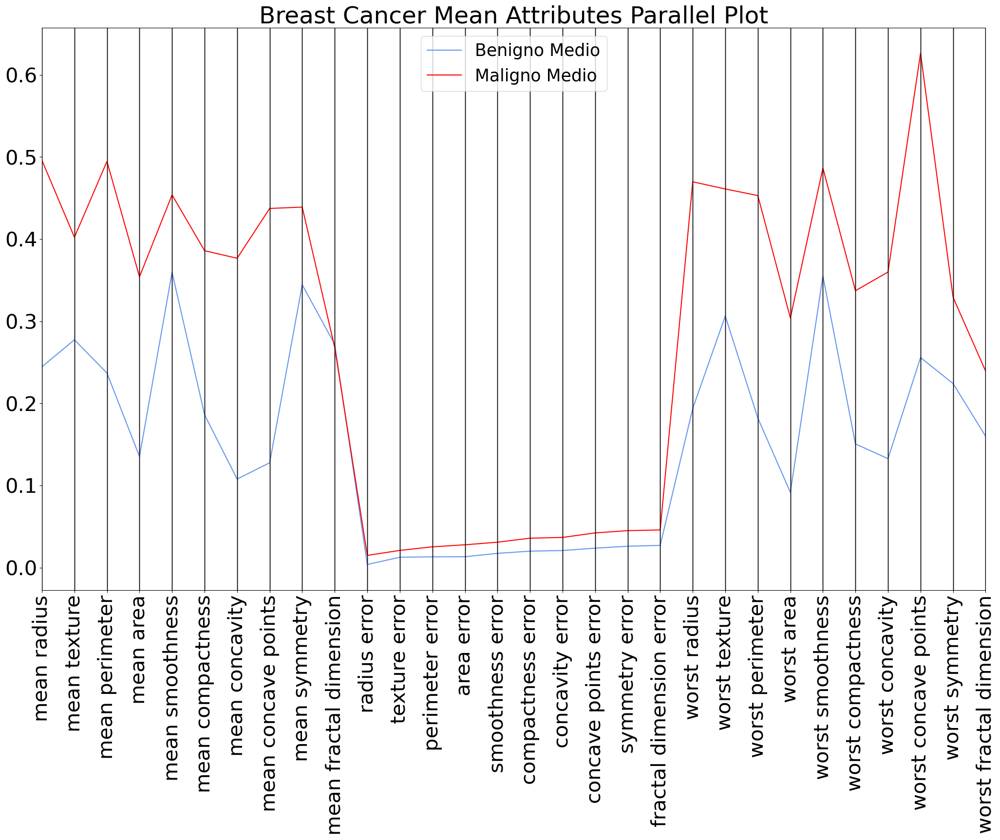

In [33]:
plt.style.use('default')
plt.rc('figure', figsize=(25.0, 15.0))
parallel_coordinates(paziente_benigno_medio_dataframe_norm, 'Type',
                     color='#6495ed',
                     alpha=1,)

parallel_coordinates(paziente_maligno_medio_dataframe_norm, 'Type',
                     color='red',
                     alpha=1,)
plt.xticks(rotation=90)
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)
L=plt.legend(fontsize=25, loc='upper center')
L.get_texts()[1].set_text('Maligno Medio')
L.get_texts()[0].set_text('Benigno Medio')
plt.title("Breast Cancer Mean Attributes Parallel Plot", size=35)
plt.show()

<font size=8> Confronto pazienti medi con group bar chart </font>

In [34]:
maligno_mean= paziente_maligno_medio_lista_norm[1:11]
benigno_mean= paziente_benigno_medio_lista_norm[1:11]

meligno_worst= paziente_maligno_medio_lista_norm[21:31]
benigno_worst= paziente_benigno_medio_lista_norm[21:31]

labels_mean=labels[1:11]
labels_worst=labels[21:31]

<font size=6> Group bar chart per confronto pazienti medi mean </font>

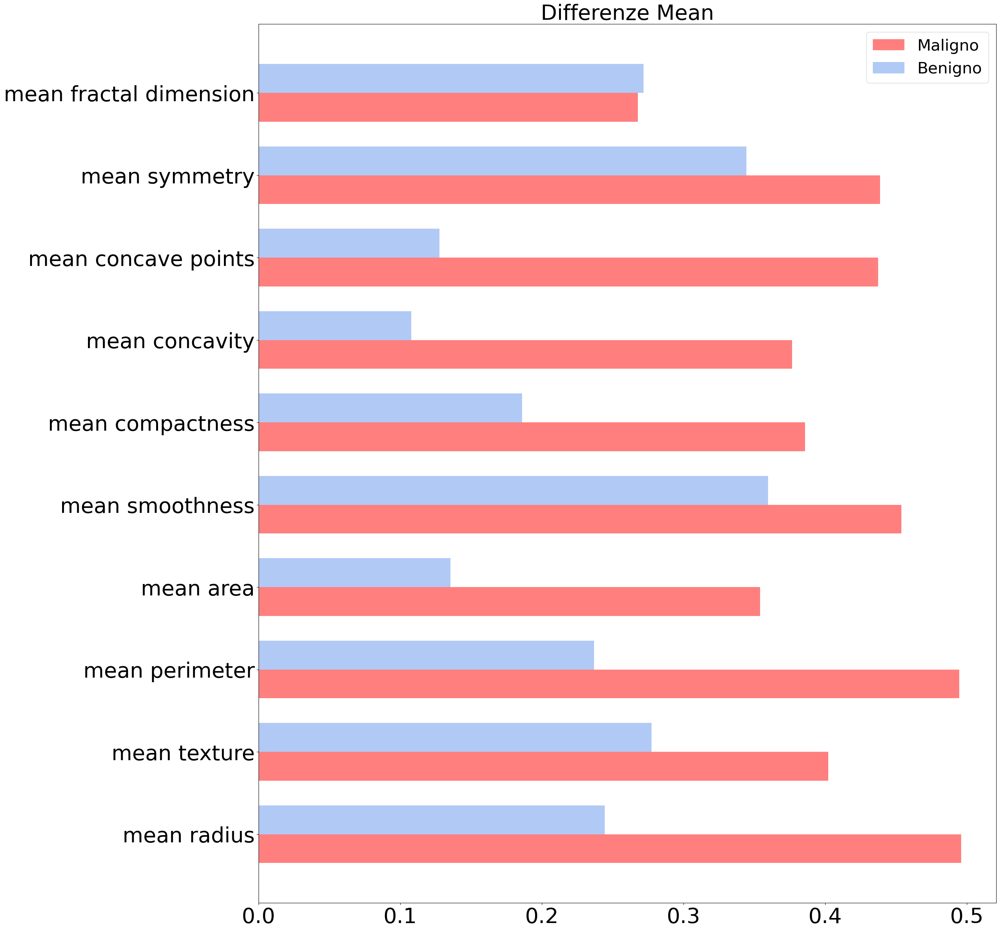

In [35]:
plt.rc('figure', figsize=(25.0, 30.0))

x = np.arange(len(labels_mean))
width = 0.35

fig, ax = plt.subplots()
rects1 = ax.barh(x - width/2, maligno_mean, width, label='Maligno', alpha=0.5, color='red')
rects2 = ax.barh(x + width/2, benigno_mean, width, label='Benigno', alpha=0.5, color='#6495ed')

ax.set_title('Differenze Mean', size=40)
ax.set_yticks(x)
ax.set_yticklabels(labels_mean)
ax.legend()
plt.xticks(fontsize=40)
plt.yticks(fontsize=40)
plt.legend(fontsize=30)

plt.show()

<font size=6> Group bar chart per confronto pazienti medi mean </font>

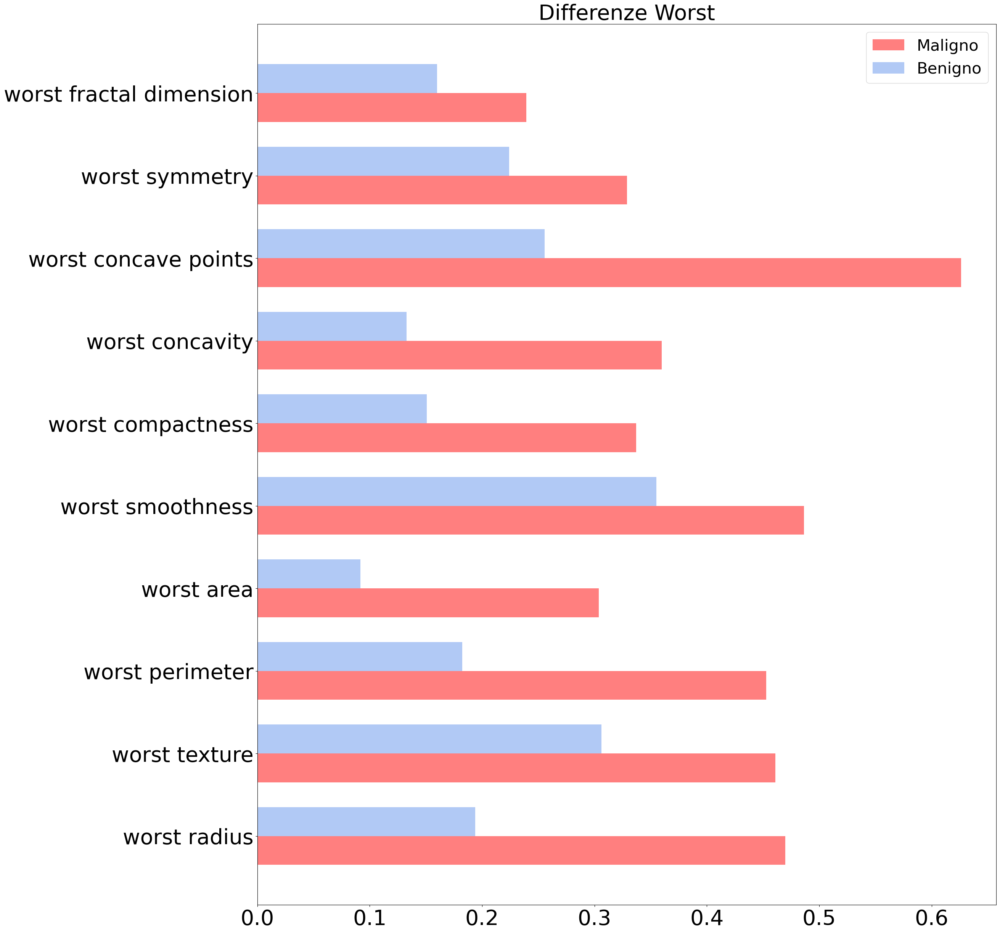

In [36]:
plt.rc('figure', figsize=(25.0, 30.0))

x = np.arange(len(labels_worst))
width = 0.35

fig, ax = plt.subplots()
rects1 = ax.barh(x - width/2, meligno_worst, width, label='Maligno', alpha=0.5, color='red')
rects2 = ax.barh(x + width/2, benigno_worst, width, label='Benigno', alpha=0.5, color='#6495ed')

ax.set_title('Differenze Worst', size=40)
ax.set_yticks(x)
ax.set_yticklabels(labels_worst)
ax.legend()
plt.xticks(fontsize=40)
plt.yticks(fontsize=40)
plt.legend(fontsize=30)

plt.show()

<font size=6> Group bar chart per confronto pazienti medi mean con errore </font>

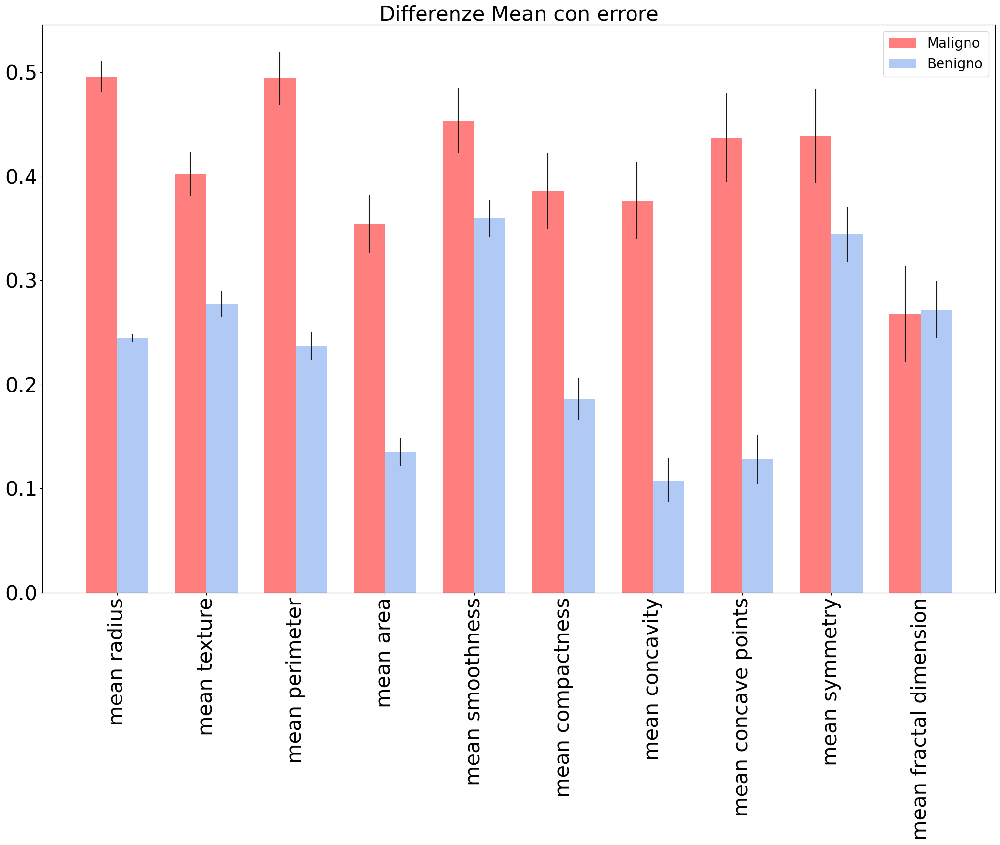

In [37]:
plt.rc('figure', figsize=(25.0, 15.0))

x = np.arange(len(labels_mean)) 
width = 0.35

fig, ax = plt.subplots()
rects1 = ax.bar(x - width/2, maligno_mean, width, yerr=mse_error_maligni_list, label='Maligno', alpha=0.5, color='red')
rects2 = ax.bar(x + width/2, benigno_mean, width, yerr=mse_error_benigni_list, label='Benigno', alpha=0.5, color='#6495ed')

ax.set_title('Differenze Mean con errore', size=30)
ax.set_xticks(x)
ax.set_xticklabels(labels_mean)
ax.legend()

plt.xticks(rotation=90)
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)
plt.legend(fontsize=20)

plt.show() 

<font size=8> Heatmap divisi tra maligni e benigni </font>

In [38]:
mean_benigni = pazienti_benigni_norm.iloc[list(pazienti_benigni_norm.index), [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]]
mean_maligni = pazienti_maligni_norm.iloc[list(pazienti_maligni_norm.index), [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]]

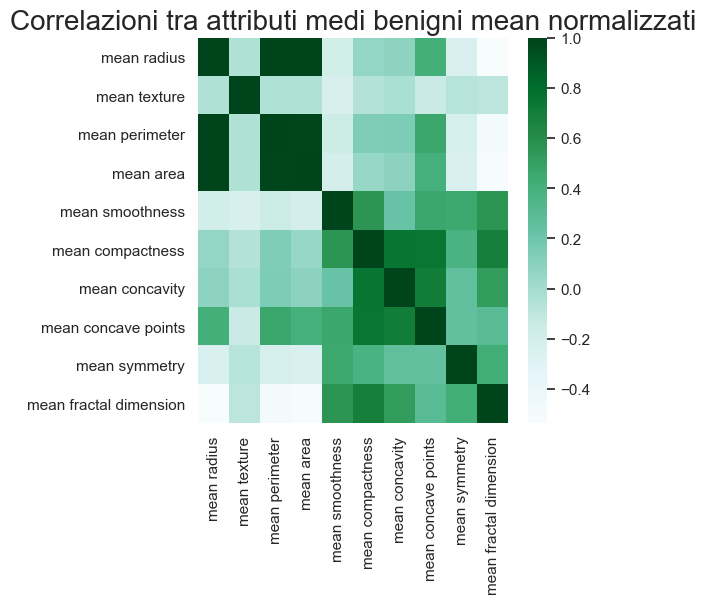

In [39]:
sns.set(rc={'figure.figsize':(5,5)})

sns.heatmap(mean_benigni.corr(), cmap='BuGn').set_title("Correlazioni tra attributi medi benigni mean normalizzati", size= 20)
plt.show()

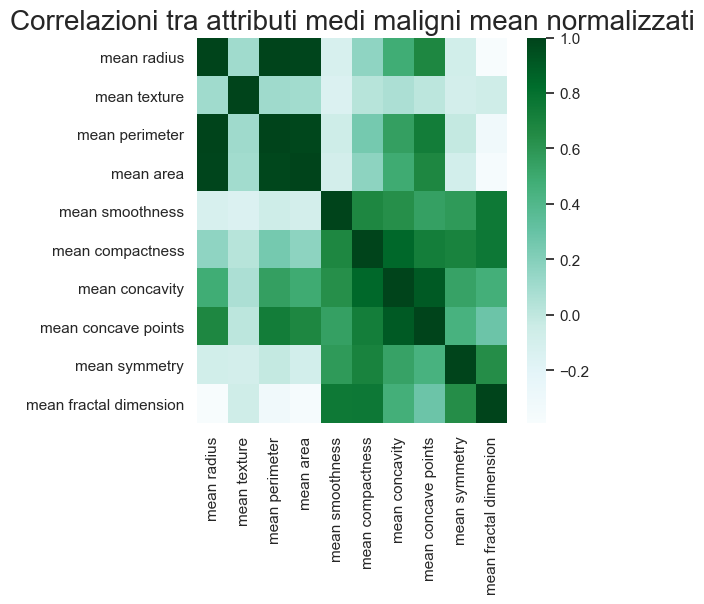

In [40]:
sns.set(rc={'figure.figsize':(5,5)})

sns.heatmap(mean_maligni.corr(), cmap='BuGn').set_title("Correlazioni tra attributi medi maligni mean normalizzati", size= 20)
plt.show()